<a href="https://colab.research.google.com/github/SantonioTheFirst/DataAnalysis/blob/main/lab5/DCGANime.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [2]:
!kaggle datasets download -d splcher/animefacedataset

 98% 385M/395M [00:10<00:00, 48.1MB/s]
100% 395M/395M [00:10<00:00, 40.7MB/s]


In [3]:
!unzip -q animefacedataset.zip

In [1]:
from PIL import Image
import numpy as np
import os

In [ ]:
im = Image.open('images/0_2000.jpg')

In [ ]:
np.asarray(im).shape

(64, 64, 3)

In [ ]:
im.size

(64, 64)

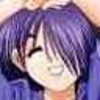

In [ ]:
im.resize((100, 100))

In [ ]:
im.close()

In [ ]:
image_size = 64

def resize_all_images():
    names = os.listdir('images')
    for i, name in enumerate(names):
        img = Image.open('images/' + name)
        img = img.resize((image_size, image_size))
        img.save('images/' + name)
        img.close()
        if i % 10000 == 0:
            print(i)
    print('Ok')

In [ ]:
resize_all_images()

0
10000
20000
30000
40000
50000
60000
Ok


In [ ]:
def make_dataset():
    names = os.listdir('images')
    # img = Image.open('images/' + names[0])
    X = []
    # X = (np.array(img, dtype=np.float16).reshape(image_size * image_size * 3) - 127.5) / 127.5
    # img.close()
    for i, name in enumerate(names):
        img = Image.open('images/' + name)
        X.append((np.array(img, dtype=np.float16).reshape(image_size * image_size * 3) - 127.5) / 127.5)
        # X.append((np.array(img, dtype=np.float16).reshape(image_size * image_size * 3)) / 255.0)
        img.close()
        if i % 10000 == 0:
            print(i)
    return np.array(X)

In [ ]:
input_dim = 64 * 64 * 3

In [2]:
import tensorflow
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import initializers

import matplotlib.pyplot as plt
import numpy as np

np.random.seed(1000)

optim = tensorflow.keras.optimizers.Adam(learning_rate=0.0001, beta_1=0.5)

In [ ]:
def get_discriminator():
    model =  keras.Sequential()
    model.add(layers.Dense(1024, input_dim=input_dim, kernel_initializer=initializers.RandomNormal(stddev=0.02)))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))
        
    model.add(layers.Dense(512))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))
    
    model.add(layers.Dense(256))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))
        
    model.add(layers.Dense(1, activation='sigmoid'))
    model.compile(loss='binary_crossentropy', optimizer=optim)

    return model


latent_dim = 100


def get_generator():
    model =  keras.Sequential()
    model.add(layers.Dense(256, input_dim=latent_dim, kernel_initializer=initializers.RandomNormal(stddev=0.02)))
    model.add(layers.LeakyReLU(alpha=0.2))
    
    model.add(layers.Dense(512))
    model.add(layers.LeakyReLU(alpha=0.2))
    
    model.add(layers.Dense(1024))
    model.add(layers.LeakyReLU(alpha=0.2))
    
    model.add(layers.Dense(input_dim, activation='tanh'))
    model.compile(loss='binary_crossentropy', optimizer=optim)
    return model 


In [ ]:
discriminator = get_discriminator()
generator = get_generator()

# Combined network
discriminator.trainable = False
gan_input = keras.Input(shape=(latent_dim,))
x = generator(gan_input)
gan_output = discriminator(x)
gan = keras.Model(inputs=gan_input, outputs=gan_output)
gan.compile(loss='binary_crossentropy', optimizer=optim)

In [3]:
latent_dim = 100

In [4]:
generated_noise = np.random.normal(0, 1, size=[5, latent_dim])

In [5]:
def plot_generated_images(epoch, generator):
    num_of_images = 5
    noise = generated_noise #np.random.normal(0, 1, size=[num_of_images, latent_dim])
    generated_images = generator.predict(noise).reshape(num_of_images, 32, 32, 3)
    plt.figure(figsize=(10, 10))
    for i in range(num_of_images):
        plt.subplot(1, 5, i + 1)
        plt.imshow((generated_images[i] + 1) / 2)
        plt.axis('off')
        plt.tight_layout()
    plt.show()

In [ ]:
discrim_losses = []

def train_model(epochs, batch_size, X_input):
    num_batches = int(X_input.shape[0] / batch_size)
    for ep in range(epochs+1):
        for i in range(num_batches):
            noise = np.random.normal(0, 1, size=[batch_size, latent_dim])
            image_batch = X_input[np.random.randint(0, X_input.shape[0], size=batch_size)]
            
            generated_images = generator.predict(noise)
            X = np.concatenate([image_batch, generated_images])

            # Labels for generated and real data
            y_dis = np.zeros(2 * batch_size)
            y_dis[:batch_size] = 0.9
            # Train discriminator
            discriminator.trainable = True
            d_loss = discriminator.train_on_batch(X, y_dis)
            discrim_losses.append(d_loss)

            # Train generator
            noise = np.random.normal(0, 1, size=[batch_size, latent_dim])
            y_gen = np.ones(batch_size)
            discriminator.trainable = False
            gan.train_on_batch(noise, y_gen)
        # if ep % 20 == 0:
        print('epoch: ', ep)
        plot_generated_images(ep, generator)

In [ ]:
X = make_dataset()
np.save('X.npy', X)

0
10000
20000
30000
40000
50000
60000


In [ ]:
X = np.load('X.npy')

In [ ]:
np.random.normal(0, 1)

-0.1474134893146519

epoch:  0


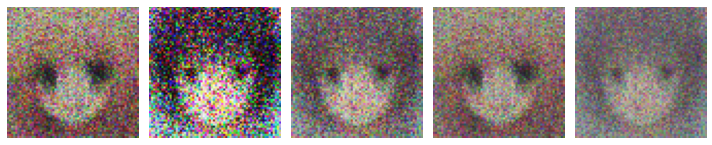

epoch:  1


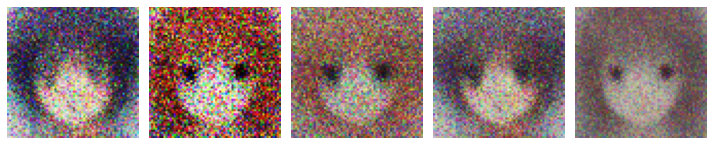

epoch:  2


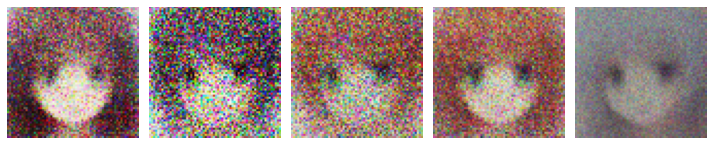

epoch:  3


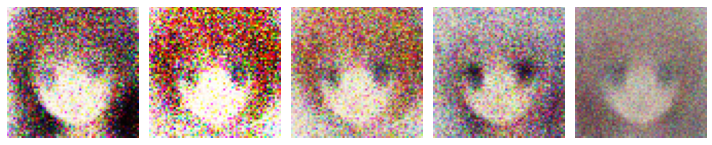

epoch:  4


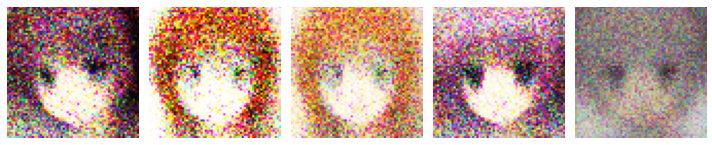

epoch:  5


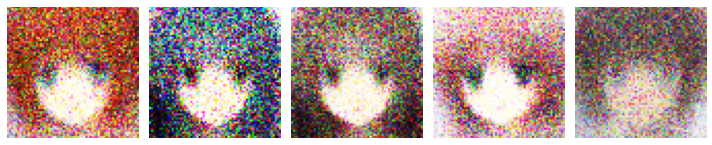

epoch:  6


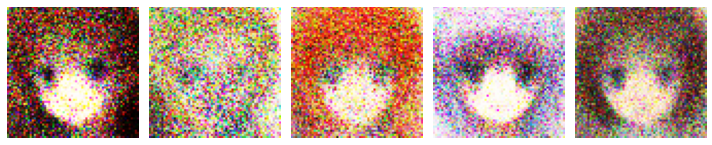

epoch:  7


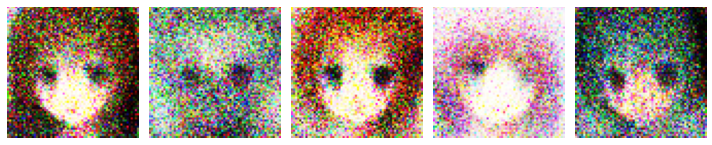

epoch:  8


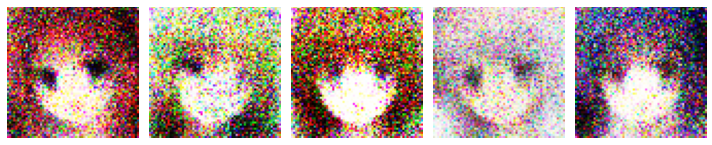

epoch:  9


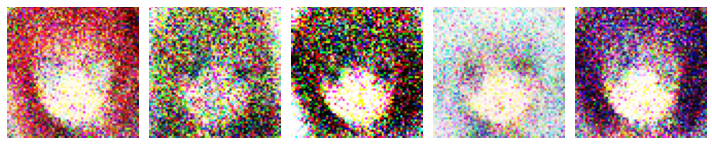

epoch:  10


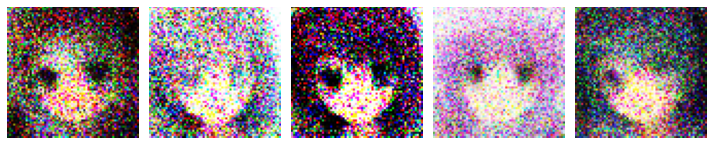

epoch:  11


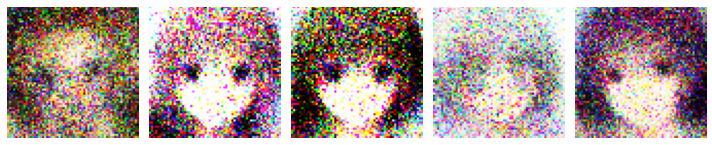

epoch:  12


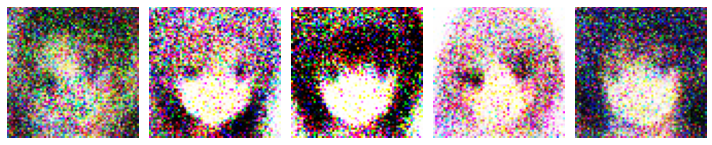

epoch:  13


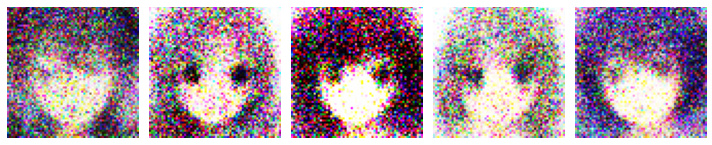

epoch:  14


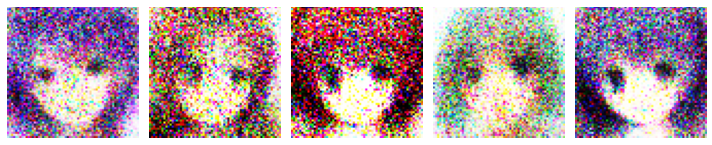

epoch:  15


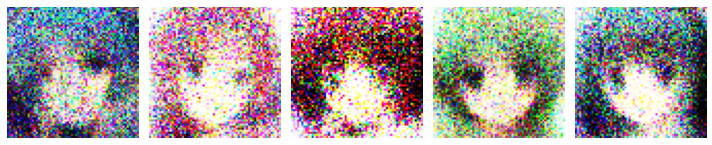

epoch:  16


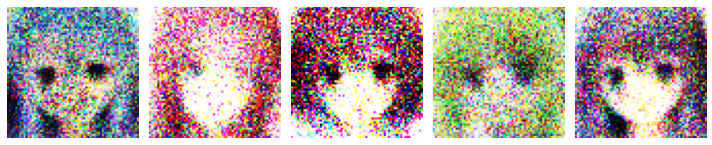

epoch:  17


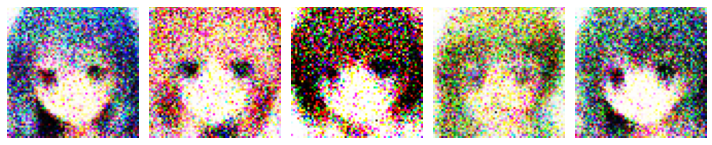

epoch:  18


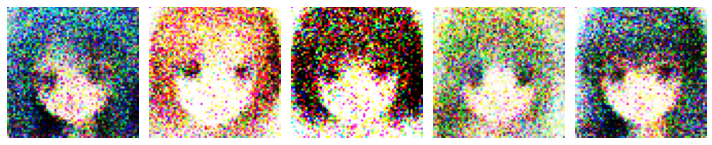

epoch:  19


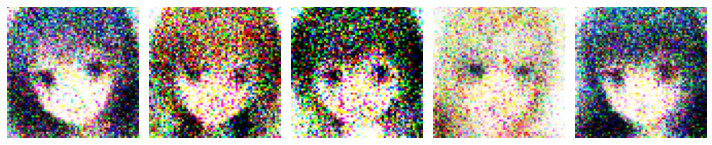

epoch:  20


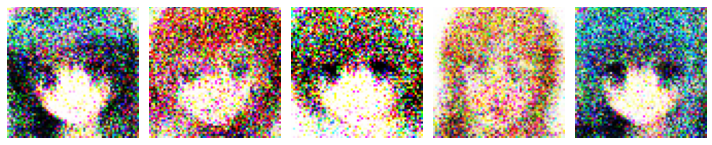

epoch:  21


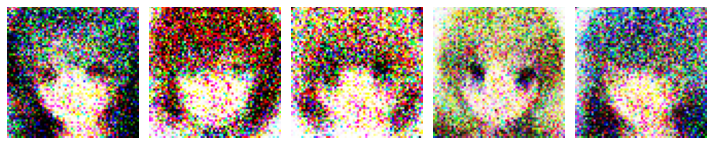

epoch:  22


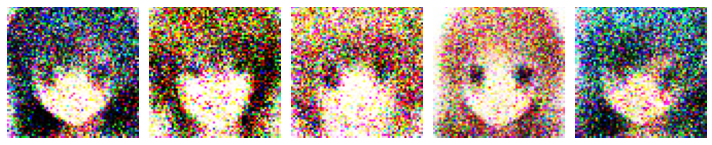

epoch:  23


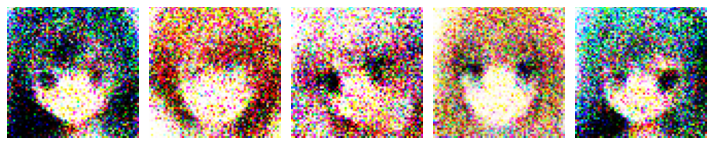

epoch:  24


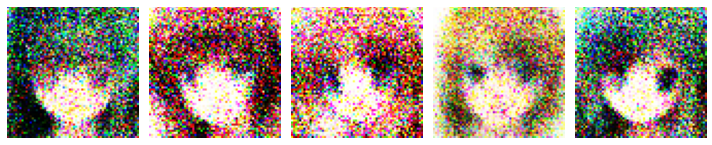

epoch:  25


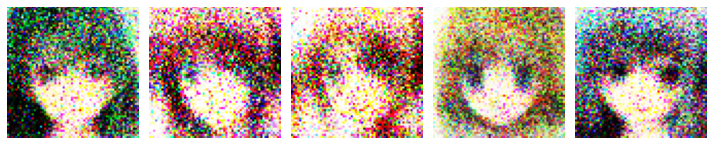

epoch:  26


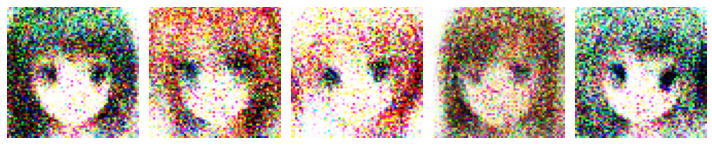

epoch:  27


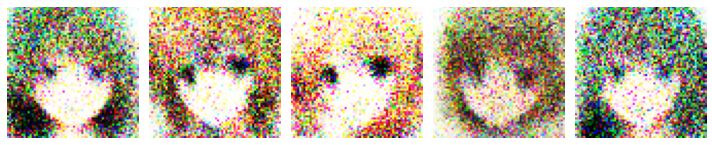

epoch:  28


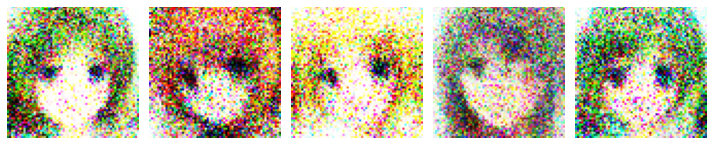

epoch:  29


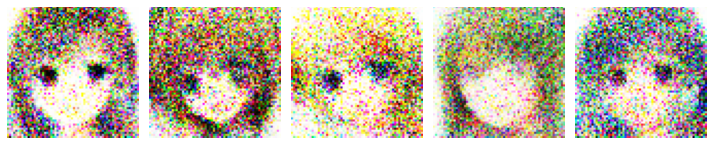

epoch:  30


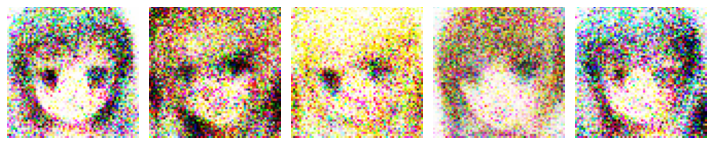

epoch:  31


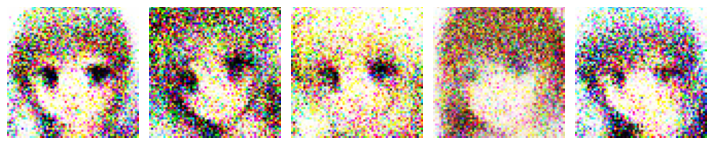

epoch:  32


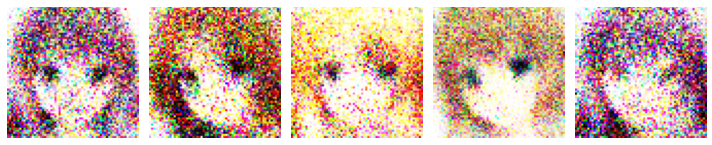

epoch:  33


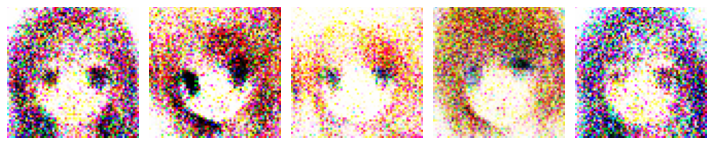

epoch:  34


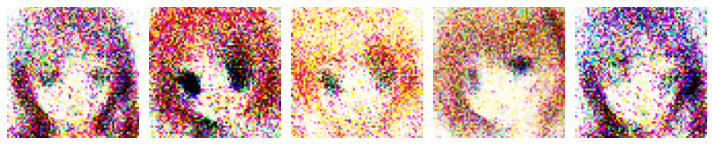

epoch:  35


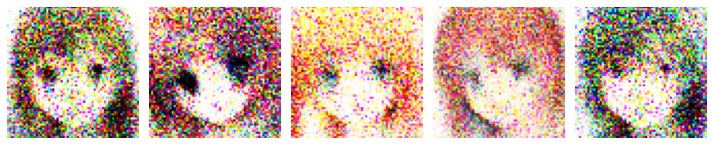

epoch:  36


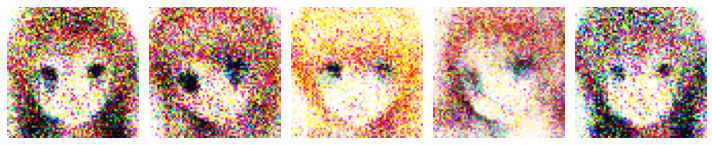

epoch:  37


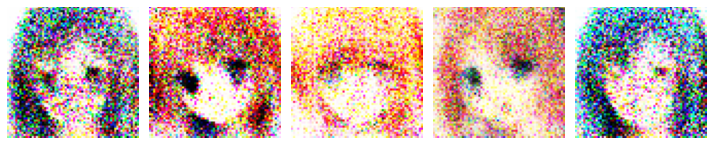

epoch:  38


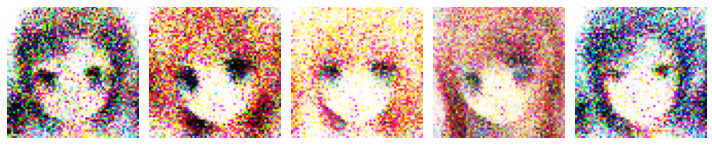

epoch:  39


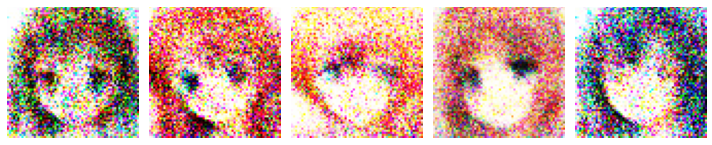

epoch:  40


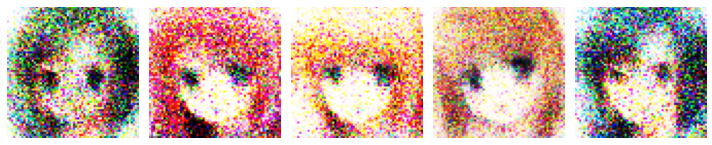

epoch:  41


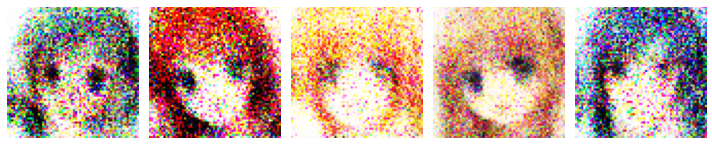

epoch:  42


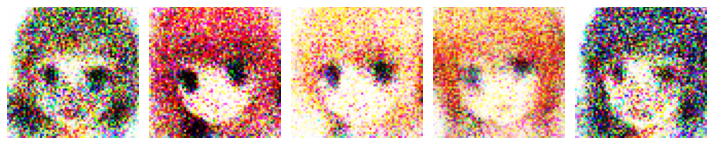

epoch:  43


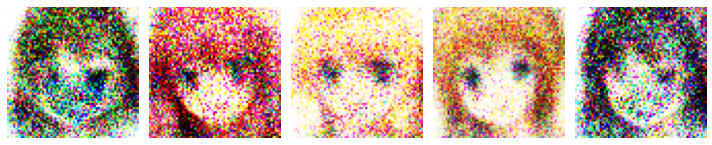

epoch:  44


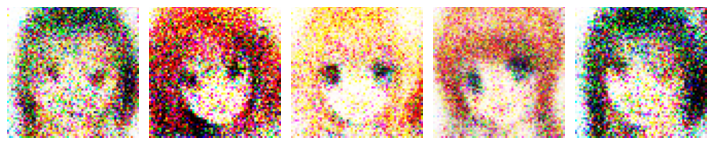

epoch:  45


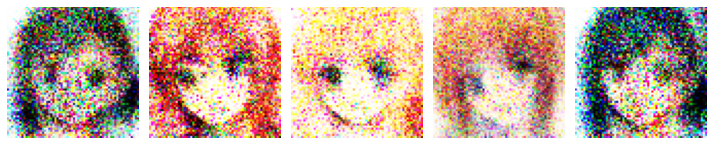

epoch:  46


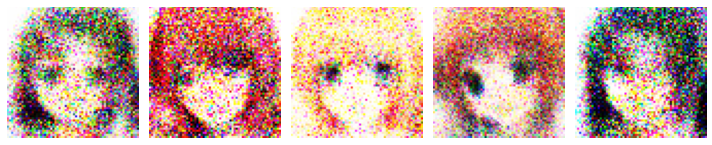

KeyboardInterrupt: ignored

In [ ]:
epochs = 100
batch_size = 128
train_model(epochs, batch_size, X)

In [ ]:
noise = noise = np.random.normal(0, 1, size=[1, latent_dim])
arr_img = generator.predict(noise).reshape(64, 64, 3)

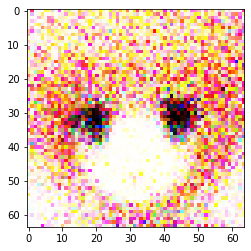

In [ ]:
plt.imshow(arr_img)

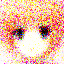

In [ ]:
Image.fromarray((arr_img * 255.0).astype(np.uint8))

In [6]:
from tensorflow.keras.layers import Dense, Conv2D, Conv2DTranspose, LeakyReLU, Dropout, Flatten, Reshape

In [7]:
def get_dcgan_discriminator():
    model = tensorflow.keras.models.Sequential()
    # normal
    model.add(Conv2D(64, (3,3), padding='same', input_shape=(32, 32, 3)))
    model.add(LeakyReLU(alpha=0.2))
    # downsample
    model.add(Conv2D(128, (3,3), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # downsample
    model.add(Conv2D(128, (3,3), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # downsample
    model.add(Conv2D(256, (3,3), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # classifier
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation='sigmoid'))
    # compile model
    model.compile(loss='binary_crossentropy', optimizer=optim, metrics=['accuracy'])

    return model


def get_dcgan_generator():
    model = tensorflow.keras.models.Sequential()
    # foundation for 4x4 image
    n_nodes = 256 * 4 * 4
    model.add(Dense(n_nodes, input_dim=latent_dim))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Reshape((4, 4, 256)))
    # upsample to 8x8
    model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # upsample to 16x16
    model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # upsample to 32x32
    model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))

    # model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
    # model.add(LeakyReLU(alpha=0.2))

    # output layer
    model.add(Conv2D(3, (3,3), activation='tanh', padding='same'))
    return model 

In [8]:
generator = get_dcgan_generator()
discriminator = get_dcgan_discriminator()

In [9]:
discriminator.trainable = False
# connect them
gan = tensorflow.keras.models.Sequential()
# add generator
gan.add(generator)
# add the discriminator
gan.add(discriminator)
# compile model
gan.compile(loss='binary_crossentropy', optimizer=optim)

In [10]:
discrim_losses = []

def train_model(epochs, batch_size, X_input):
    num_batches = int(X_input.shape[0]/batch_size)
    for ep in range(epochs+1):
        for i in range(num_batches):
            noise = np.random.normal(0, 1, size=[batch_size, latent_dim])
            image_batch = X_input[np.random.randint(0, X_input.shape[0], size=batch_size)]
            
            generated_images = generator.predict(noise)
            
            X = np.concatenate([image_batch, generated_images])

            # Labels for generated and real data
            y_dis = np.zeros(2 * batch_size)
            y_dis[:batch_size] = 0.9
            # Train discriminator
            discriminator.trainable = True
            d_loss, _ = discriminator.train_on_batch(X, y_dis)
            discrim_losses.append(d_loss)

            # Train generator
            noise = np.random.normal(0, 1, size=[batch_size, latent_dim])
            y_gen = np.ones(batch_size)
            discriminator.trainable = False
            gan.train_on_batch(noise, y_gen)
        # if ep % 20 == 0:
        print('epoch: ', ep)
        plot_generated_images(ep, generator)

In [11]:
def make_dcgan_dataset():
    names = os.listdir('images')
    # img = Image.open('images/' + names[0])
    X = []
    # X = (np.array(img, dtype=np.float16).reshape(image_size * image_size * 3) - 127.5) / 127.5
    # img.close()
    for i, name in enumerate(names):
        img = Image.open('images/' + name).resize((32, 32))
        X.append((np.array(img, dtype=np.float16) - 127.5) / 127.5)
        # X.append((np.array(img, dtype=np.float16).reshape(image_size * image_size * 3)) / 255.0)
        img.close()
        if i % 10000 == 0:
            print(i)
    return np.array(X)

In [12]:
X = make_dcgan_dataset()

0
10000
20000
30000
40000
50000
60000


In [13]:
X.shape

(63565, 32, 32, 3)

epoch:  0


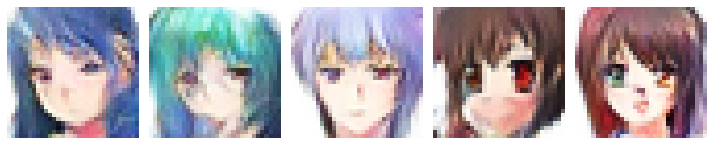

epoch:  1


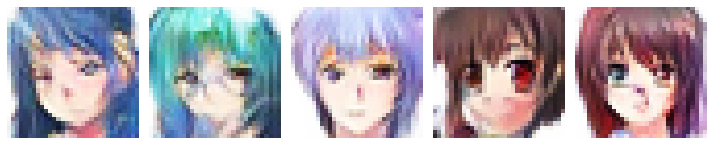

epoch:  2


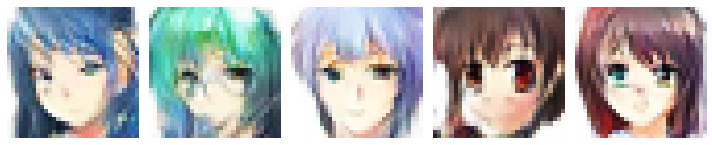

epoch:  3


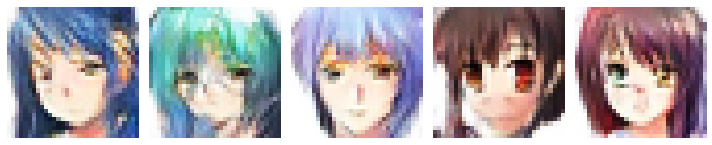

epoch:  4


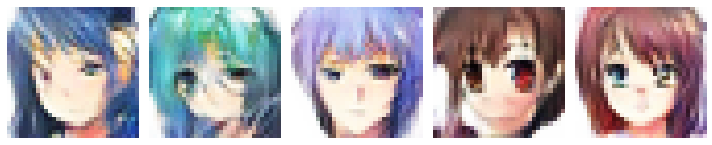

epoch:  5


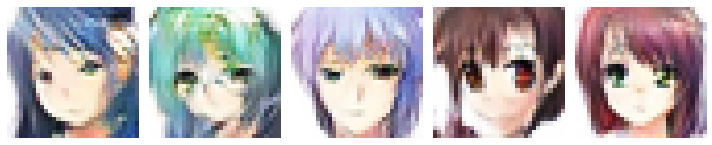

epoch:  6


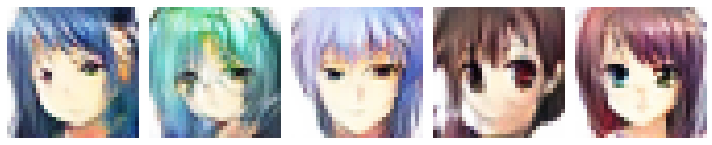

epoch:  7


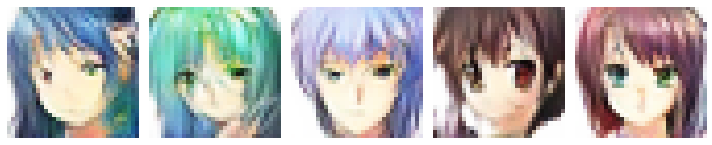

epoch:  8


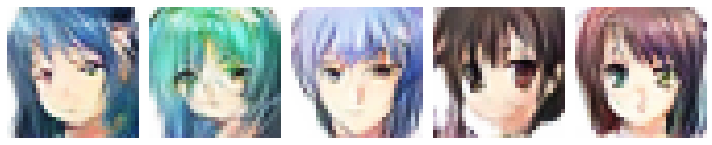

epoch:  9


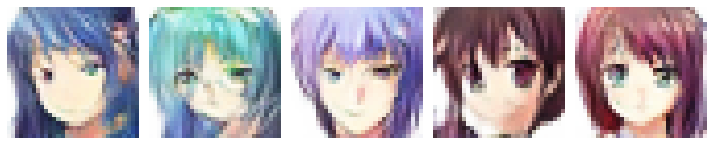

epoch:  10


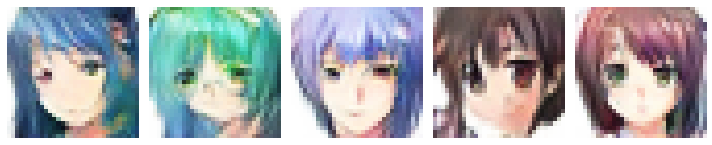

epoch:  11


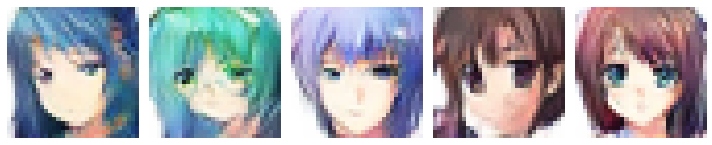

epoch:  12


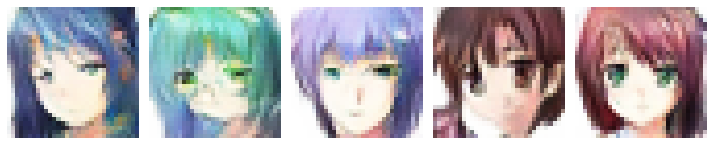

epoch:  13


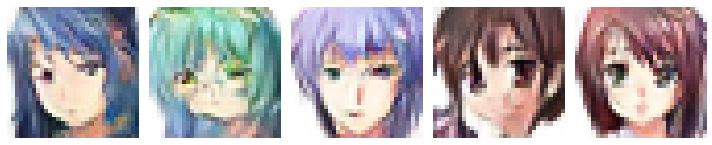

epoch:  14


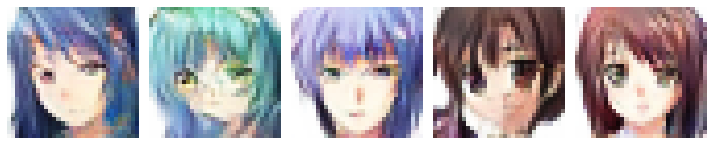

epoch:  15


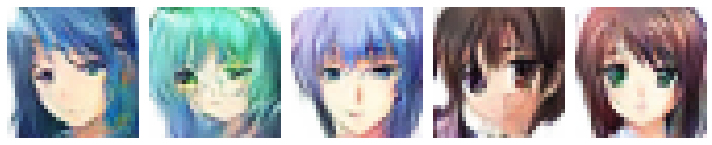

epoch:  16


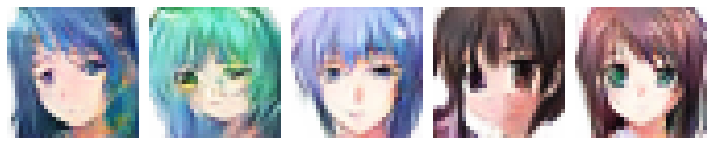

epoch:  17


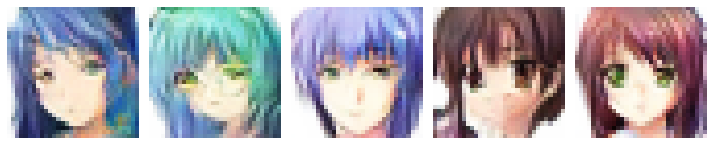

epoch:  18


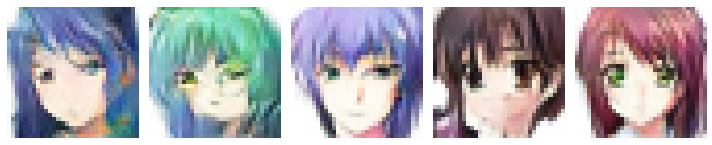

epoch:  19


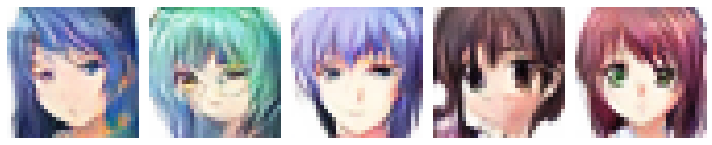

epoch:  20


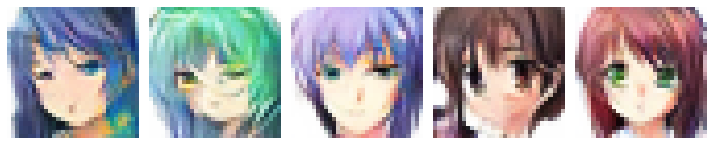

epoch:  21


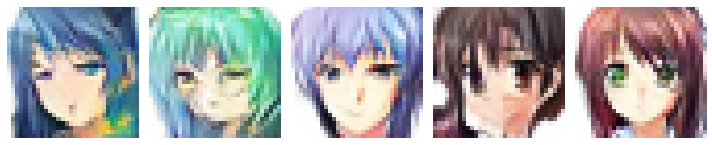

epoch:  22


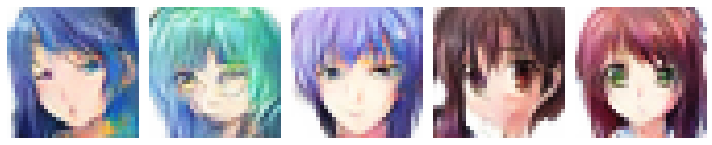

epoch:  23


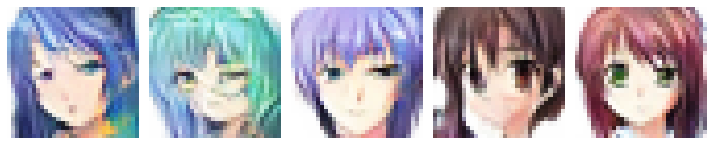

epoch:  24


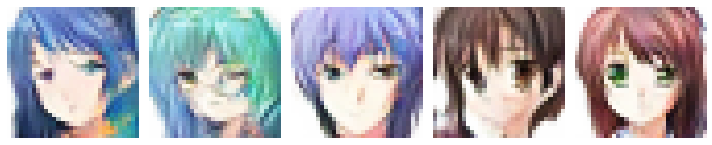

epoch:  25


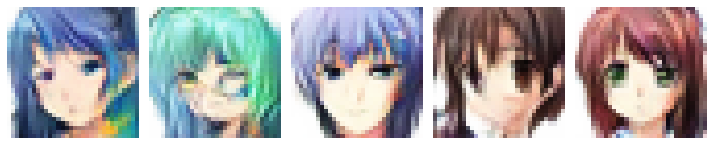

epoch:  26


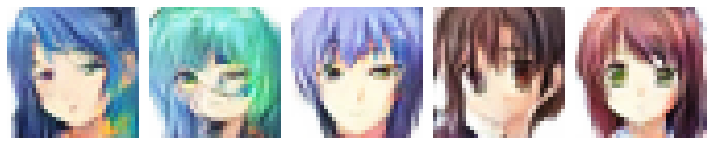

epoch:  27


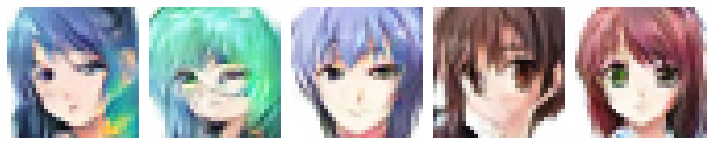

epoch:  28


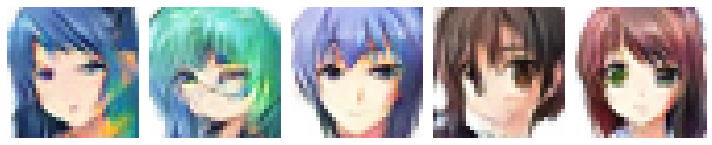

epoch:  29


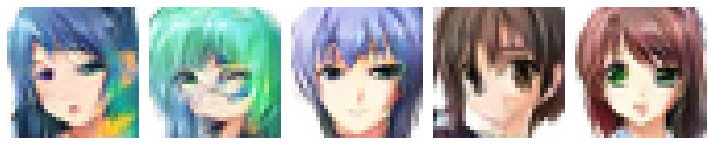

epoch:  30


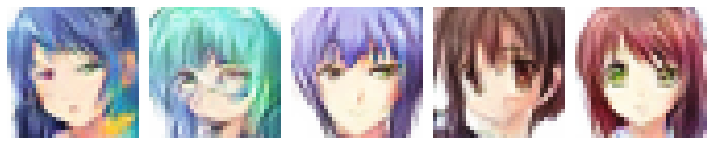

In [58]:
# Это второй запуск на 30 эпох. Поэтому здесь отображены 30-60 эпохи

epochs = 30
batch_size = 128
train_model(epochs, batch_size, X)

In [59]:
import pickle

In [60]:
with open('generator.pkl', 'wb') as f:
    pickle.dump(generator, f)

INFO:tensorflow:Assets written to: ram://51c0eee6-6290-41d7-a1b2-924017c3c21e/assets


In [61]:
with open('discriminator.pkl', 'wb') as f:
    pickle.dump(discriminator, f)

INFO:tensorflow:Assets written to: ram://8105696b-8ec5-4a16-8f00-bf6b2ba44784/assets


In [62]:
with open('gan.pkl', 'wb') as f:
    pickle.dump(gan, f)

INFO:tensorflow:Assets written to: ram://11c17a91-f334-4702-8b73-d9bd341194ff/assets


In [63]:
with open('generator.pkl', 'rb') as f:
    test_generator = pickle.load(f)

In [64]:
test_generator.compile(optimizer=optim, metrics=['accuracy'])

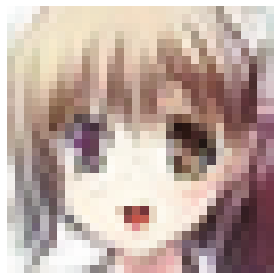

In [103]:
# %%timeit
pr = test_generator.predict(np.random.normal(0, 1, size=[1, 100]))
pr = (pr + 1) / 2.0
plt.imshow(pr[0])
plt.axis('off')
plt.tight_layout()
plt.show()
im = Image.fromarray((pr[0] * 255.0).astype(np.uint8))

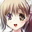

In [104]:
im

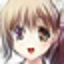

In [105]:
im.resize((64, 64))

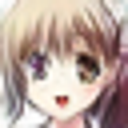

In [106]:
im.resize((128, 128))

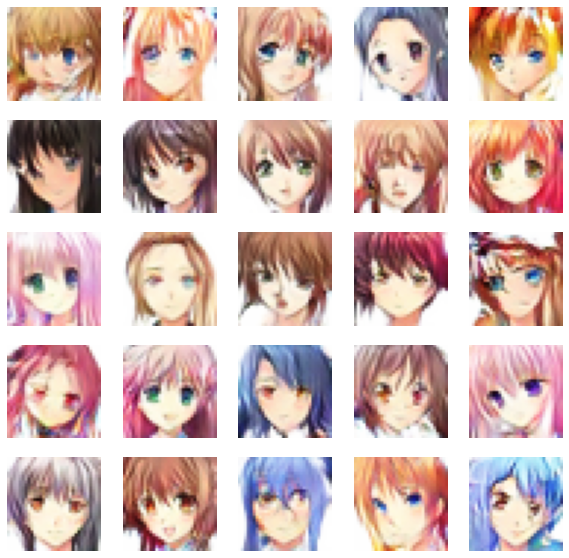

In [133]:
num_of_images = 25
noise = np.random.normal(0, 1, size=[num_of_images, latent_dim])
generated_images = generator.predict(noise).reshape(num_of_images, 32, 32, 3)
plt.figure(figsize=(10, 10))
for i in range(25):
    plt.subplot(5, 5, i + 1)
    plt.imshow((generated_images[i] + 1) / 2.0)
    # plt.tight_layout()
    plt.axis('off')

plt.show()